# Data Challenge

## Data Preparation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

In [2]:
df = pd.read_pickle('Datos_data_challenge.pkl')

In [3]:
df

{'flow': array([1.72378057e+00, 9.60881602e-01, 1.00000000e-03, ...,
        3.55681843e+00, 3.40213266e+00, 1.81279569e+00]),
 'obs_tas': array([[-10.60000038,  -9.69999981,  -6.69999981, ...,  -8.10000038,
          -6.5       ,  -5.4000001 ],
        [-20.5       , -19.10000038, -12.        , ..., -15.5       ,
         -11.80000019,  -9.10000038],
        [-23.60000038, -22.5       , -15.10000038, ..., -19.39999962,
         -14.60000038, -12.19999981],
        ...,
        [-11.89999962, -11.39999962,  -8.39999962, ...,  -9.30000019,
          -7.19999981,  -6.30000019],
        [ -7.        ,  -6.5       ,  -3.4000001 , ...,  -5.        ,
          -3.79999995,  -3.        ],
        [ -2.4000001 ,  -2.0999999 ,   1.29999995, ...,  -0.89999998,
           0.5       ,   1.10000002]]),
 'flow_dates': 1958-01-04   1958-01-04
 1958-01-05   1958-01-05
 1958-01-06   1958-01-06
 1958-01-07   1958-01-07
 1958-01-08   1958-01-08
                 ...    
 2016-12-22   2016-12-22
 2016-12-2

In [4]:
target=pd.DataFrame.from_dict(df['flow'])
target.columns=['Flow']
target.shape

(21542, 1)

In [5]:
target_dates=pd.DataFrame.from_dict(df['flow_dates'])
target_dates.columns=['Flow_Dates']
target_dates.index=range(len(target_dates))
target_dates.shape

(21542, 1)

In [6]:
target['Dates']=target_dates['Flow_Dates']
target=target.set_index('Dates')
target.head()

,Flow
Dates,
1958-01-04,1.723781
1958-01-05,0.960882
1958-01-06,0.001000
1958-01-07,0.001000
1958-01-08,0.316796


In [7]:
target_lon_lat=pd.DataFrame.from_dict(df['obs_lon_lat'])
target_lon_lat

,0
0,9.37
1,60.23


In [8]:
pred_temp=pd.DataFrame.from_dict(df['obs_tas'])
pred_temp.columns=['Temp1','Temp2','Temp3','Temp4','Temp5','Temp6','Temp7','Temp8','Temp9']
pred_temp.shape

(21546, 9)

In [9]:
pred_prec=pd.DataFrame.from_dict(df['obs_pr'])
pred_prec.columns=['Prec1','Prec2','Prec3','Prec4','Prec5','Prec6','Prec7','Prec8','Prec9']
pred_prec.shape

(21546, 9)

In [10]:
pred_dates=pd.DataFrame.from_dict(df['obs_dates'])
pred_dates.columns=['Observation_Dates']
pred_dates.index=range(len(pred_dates))
pred_dates.shape

(21546, 1)

In [11]:
pred=pred_temp
pred[['Prec1','Prec2','Prec3','Prec4','Prec5','Prec6','Prec7','Prec8','Prec9']]=pred_prec[['Prec1','Prec2','Prec3','Prec4','Prec5','Prec6','Prec7','Prec8','Prec9']]
pred['Dates']=pred_dates['Observation_Dates']
pred=pred.set_index('Dates')
pred.head()

,Temp1,Temp2,Temp3,Temp4,Temp5,Temp6,Temp7,Temp8,Temp9,Prec1,Prec2,Prec3,Prec4,Prec5,Prec6,Prec7,Prec8,Prec9
Dates,,,,,,,,,,,,,,,,,,
1957-01-01,-10.600000,-9.7,-6.7,-8.800000,-8.900000,-7.500000,-8.1,-6.5,-5.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1
1957-01-02,-20.500000,-19.1,-12.0,-17.700001,-17.700001,-13.100000,-15.5,-11.8,-9.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.1
1957-01-03,-23.600000,-22.5,-15.1,-21.400000,-21.400000,-16.299999,-19.4,-14.6,-12.2,0.1,0.0,0.3,0.1,0.3,0.3,0.4,0.3,0.5
1957-01-04,-16.200001,-16.0,-14.1,-15.600000,-15.400000,-14.500000,-15.0,-13.8,-11.9,1.0,0.0,1.0,1.1,0.9,0.7,0.8,0.4,0.6
1957-01-05,-7.900000,-7.8,-9.5,-7.600000,-7.500000,-8.000000,-7.4,-8.6,-8.2,9.3,8.6,8.0,8.9,8.7,10.2,9.3,10.1,9.7


In [12]:
df_full=pd.concat([target,pred],axis=1)
df_full.head()

,Flow,Temp1,Temp2,Temp3,Temp4,Temp5,Temp6,Temp7,Temp8,Temp9,Prec1,Prec2,Prec3,Prec4,Prec5,Prec6,Prec7,Prec8,Prec9
Dates,,,,,,,,,,,,,,,,,,,
1957-01-01,NaN,-10.600000,-9.7,-6.7,-8.800000,-8.900000,-7.500000,-8.1,-6.5,-5.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.1
1957-01-02,NaN,-20.500000,-19.1,-12.0,-17.700001,-17.700001,-13.100000,-15.5,-11.8,-9.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.1
1957-01-03,NaN,-23.600000,-22.5,-15.1,-21.400000,-21.400000,-16.299999,-19.4,-14.6,-12.2,0.1,0.0,0.3,0.1,0.3,0.3,0.4,0.3,0.5
1957-01-04,NaN,-16.200001,-16.0,-14.1,-15.600000,-15.400000,-14.500000,-15.0,-13.8,-11.9,1.0,0.0,1.0,1.1,0.9,0.7,0.8,0.4,0.6
1957-01-05,NaN,-7.900000,-7.8,-9.5,-7.600000,-7.500000,-8.000000,-7.4,-8.6,-8.2,9.3,8.6,8.0,8.9,8.7,10.2,9.3,10.1,9.7


In [13]:
print('Shape of dataframe:',df_full.shape)
df_full.isna().sum()

Shape of dataframe: (21910, 19)


Flow     368
Temp1    364
Temp2    364
Temp3    364
Temp4    364
Temp5    364
Temp6    364
Temp7    364
Temp8    364
Temp9    364
Prec1    364
Prec2    364
Prec3    364
Prec4    364
Prec5    364
Prec6    364
Prec7    364
Prec8    364
Prec9    364
dtype: int64

#### Missing data

In [14]:
df_clean=df_full.dropna()
df_clean.head()

,Flow,Temp1,Temp2,Temp3,Temp4,Temp5,Temp6,Temp7,Temp8,Temp9,Prec1,Prec2,Prec3,Prec4,Prec5,Prec6,Prec7,Prec8,Prec9
Dates,,,,,,,,,,,,,,,,,,,
1958-01-04,1.723781,-12.8,-13.000000,-13.0,-12.5,-12.500000,-12.7,-12.000000,-12.5,-12.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1958-01-05,0.960882,-7.8,-7.900000,-8.4,-7.0,-7.300000,-8.6,-6.500000,-7.7,-8.3,2.0,2.2,3.0,3.3,3.7,0.7,3.1,4.2,1.1
1958-01-06,0.001000,-11.0,-9.900000,-6.5,-8.5,-9.000000,-7.4,-7.900000,-6.8,-5.8,12.7,11.0,16.5,12.5,11.2,12.2,14.1,14.2,10.5
1958-01-07,0.001000,-13.2,-12.200000,-7.9,-10.7,-11.300000,-9.8,-10.100000,-8.5,-7.4,6.6,6.9,9.6,7.3,6.5,5.2,10.4,5.7,3.7
1958-01-08,0.316796,-19.9,-19.299999,-15.4,-18.4,-18.700001,-16.9,-17.700001,-15.9,-14.9,3.4,3.6,2.7,3.5,3.8,3.3,2.9,4.0,3.5


In [15]:
X_clean=df_clean.loc[:,df_clean.columns!='Flow']
Y_clean=df_clean.loc[:,df_clean.columns=='Flow']

#### Verify correlation among variables

In [16]:
df_clean.corr()

,Flow,Temp1,Temp2,Temp3,Temp4,Temp5,Temp6,Temp7,Temp8,Temp9,Prec1,Prec2,Prec3,Prec4,Prec5,Prec6,Prec7,Prec8,Prec9
Flow,1.000000,0.321395,0.328661,0.347238,0.331841,0.331223,0.340982,0.334333,0.346066,0.353181,0.214393,0.215766,0.222361,0.223283,0.218239,0.208095,0.218854,0.209890,0.200689
Temp1,0.321395,1.000000,0.998956,0.977156,0.996456,0.997461,0.990467,0.994349,0.982109,0.971150,0.116400,0.110172,0.109049,0.114553,0.107296,0.090989,0.104836,0.092479,0.087871
Temp2,0.328661,0.998956,1.000000,0.982988,0.998648,0.999480,0.994931,0.997284,0.987611,0.977994,0.115857,0.109712,0.108717,0.114058,0.106960,0.090575,0.104553,0.092335,0.087635
Temp3,0.347238,0.977156,0.982988,1.000000,0.988485,0.986217,0.993135,0.991132,0.998233,0.996440,0.132477,0.125441,0.124473,0.130504,0.123710,0.106679,0.121591,0.109213,0.103655
Temp4,0.331841,0.996456,0.998648,0.988485,1.000000,0.999552,0.996896,0.999492,0.991544,0.982389,0.119051,0.112649,0.111583,0.117214,0.110174,0.093597,0.107691,0.095358,0.090506
Temp5,0.331223,0.997461,0.999480,0.986217,0.999552,1.000000,0.996800,0.998846,0.990508,0.981441,0.116358,0.110146,0.109140,0.114523,0.107481,0.091055,0.105057,0.092816,0.088088
Temp6,0.340982,0.990467,0.994931,0.993135,0.996896,0.996800,1.000000,0.998118,0.996885,0.991050,0.119597,0.113164,0.112489,0.117749,0.110771,0.093963,0.108584,0.096431,0.091323
Temp7,0.334333,0.994349,0.997284,0.991132,0.999492,0.998846,0.998118,1.000000,0.994130,0.985909,0.119951,0.113462,0.112269,0.118000,0.110977,0.094312,0.108508,0.096177,0.091289
Temp8,0.346066,0.982109,0.987611,0.998233,0.991544,0.990508,0.996885,0.994130,1.000000,0.997029,0.127347,0.120402,0.119536,0.125286,0.118328,0.101300,0.116224,0.103903,0.098589
Temp9,0.353181,0.971150,0.977994,0.996440,0.982389,0.981441,0.991050,0.985909,0.997029,1.000000,0.134170,0.126923,0.126328,0.132141,0.125152,0.107952,0.123297,0.110678,0.105094


<AxesSubplot:>

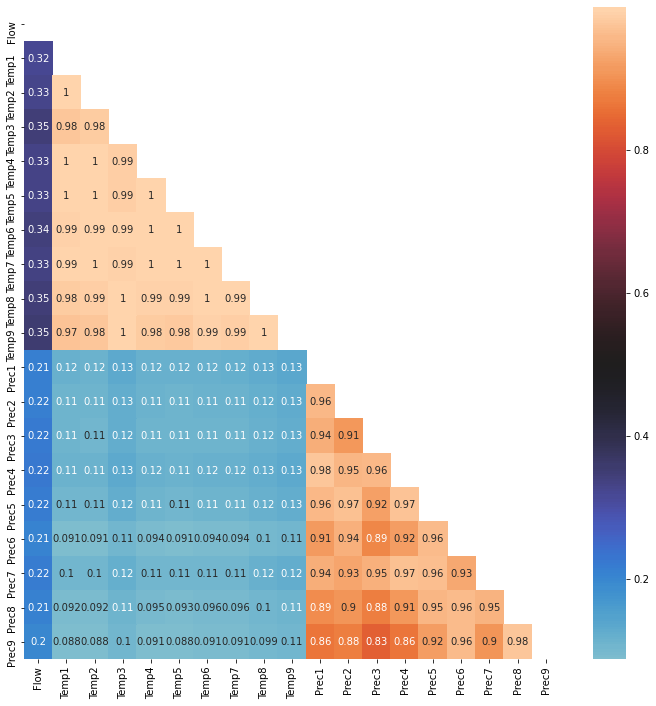

In [17]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(df_clean.corr(), dtype=bool))

plt.figure(figsize=(12,12))

# Generate a custom diverging colormap
#cmap = sns.diverging_palette(240,10,as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df_clean.corr(),mask=mask,annot=True,center=0.5)

#sns.heatmap(,annot=True)

#### Standard Scaler NO SE USA

In [18]:
'''
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
df_standard=pd.DataFrame(scaler.fit_transform(df_clean))
df_standard.columns=df_clean.columns
df_standard=df_standard.set_index(df_clean.index)
df_standard.head()
'''

'\nfrom sklearn.preprocessing import StandardScaler\nscaler=StandardScaler()\ndf_standard=pd.DataFrame(scaler.fit_transform(df_clean))\ndf_standard.columns=df_clean.columns\ndf_standard=df_standard.set_index(df_clean.index)\ndf_standard.head()\n'

In [19]:
'''
X_standard=df_standard.loc[:,df_standard.columns!='Flow']
Y_standard=df_standard.loc[:,df_standard.columns=='Flow']
'''

"\nX_standard=df_standard.loc[:,df_standard.columns!='Flow']\nY_standard=df_standard.loc[:,df_standard.columns=='Flow']\n"

## Dimensionality reduction

### 1. PCA

In [20]:
from sklearn.decomposition import PCA

pca_18=PCA(n_components=18)
#pca_18.fit(X_standard)
#X_pca_18=pca_18.transform(X_standard)
pca_18.fit(X_clean)
X_pca_18=pca_18.transform(X_clean)
np.cumsum(pca_18.explained_variance_ratio_)*100

array([ 76.65468616,  97.9835098 ,  98.78113174,  99.2646139 ,
        99.5270932 ,  99.66336551,  99.75467954,  99.81564045,
        99.86623817,  99.90431224,  99.93370473,  99.96282645,
        99.98021793,  99.98981497,  99.99537562,  99.99859152,
        99.99947057, 100.        ])

Text(0.5, 1.0, 'PCA - Components vs. Variance')

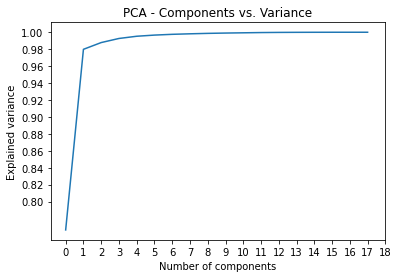

In [21]:
plt.plot(np.cumsum(pca_18.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.xticks(range(0,19,1))
plt.yticks(np.arange(0.8,1.02,.02))
plt.title('PCA - Components vs. Variance')

In [22]:
np.arange(0.9,1,.02)

array([0.9 , 0.92, 0.94, 0.96, 0.98])

In [23]:
pca_2=PCA(n_components=2)
#pca_2.fit(X_standard)
pca_2.fit(X_clean)
#X_pca_2=pca_2.transform(X_standard)
X_pca_2=pca_2.transform(X_clean)

In [24]:
df_pca_2=pd.DataFrame(X_pca_2,columns=['PC1','PC2'])
df_pca_2=df_pca_2.set_index(df_clean.index)
df_pca_2.head()

,PC1,PC2
Dates,,
1958-01-04,44.097325,-2.952575
1958-01-05,28.713932,3.565914
1958-01-06,27.130745,33.936281
1958-01-07,34.652803,16.755645
1958-01-08,57.450841,8.503166


### 2. Daily mean

In [25]:
X_mean=pd.DataFrame(columns=['TempMean','PrecMean'])
X_mean['TempMean']=X_clean[['Temp1','Temp2','Temp3','Temp4','Temp5','Temp6','Temp7','Temp8','Temp9']].mean(axis=1)
X_mean['PrecMean']=X_clean[['Prec1','Prec2','Prec3','Prec4','Prec5','Prec6','Prec7','Prec8','Prec9']].mean(axis=1)
X_mean.tail()

,TempMean,PrecMean
Dates,,
2015-12-27,-9.944444,0.555556
2015-12-28,-10.288889,4.888889
2015-12-29,-9.411111,1.277778
2015-12-30,-5.055556,3.444444
2015-12-31,-0.733333,8.322222


## Working with different time periods

#### P0: 1958-1965

In [26]:
Y_P0=Y_clean['1958-01-04':'1965-12-31']
X_pca_2_P0=df_pca_2['1958-01-04':'1965-12-31']
X_mean_P0=X_mean['1958-01-04':'1965-12-31']

df_P0=Y_P0
df_P0=df_P0.merge(X_pca_2_P0,left_index=True,right_index=True)
df_P0=df_P0.merge(X_mean_P0,left_index=True,right_index=True)
df_P0

,Flow,PC1,PC2,TempMean,PrecMean
Dates,,,,,
1958-01-04,1.723781,44.097325,-2.952575,-12.655556,0.000000
1958-01-05,0.960882,28.713932,3.565914,-7.722222,2.588889
1958-01-06,0.001000,27.130745,33.936281,-8.088889,12.766667
1958-01-07,0.001000,34.652803,16.755645,-10.122222,6.877778
1958-01-08,0.316796,57.450841,8.503166,-17.455555,3.411111
...,...,...,...,...,...
1965-12-27,0.596520,30.540626,-2.459412,-8.166667,0.500000
1965-12-28,0.001000,33.109290,-3.888930,-8.966667,0.000000
1965-12-29,1.304501,42.805926,-3.096726,-12.200000,0.000000


In [27]:
'''
df_P0.to_csv('P0.csv')
'''

"\ndf_P0.to_csv('P0.csv')\n"

#### P1: 1966-1975

In [28]:
Y_P1=Y_clean['1966-01-01':'1975-12-31']
X_pca_2_P1=df_pca_2['1966-01-01':'1975-12-31']
X_mean_P1=X_mean['1966-01-01':'1975-12-31']

df_P1=Y_P1
df_P1=df_P1.merge(X_pca_2_P1,left_index=True,right_index=True)
df_P1=df_P1.merge(X_mean_P1,left_index=True,right_index=True)
df_P1

,Flow,PC1,PC2,TempMean,PrecMean
Dates,,,,,
1966-01-01,0.957278,65.112734,-1.175313,-19.700000,0.000000
1966-01-02,0.292607,57.950971,19.088847,-17.877778,6.933333
1966-01-03,0.887541,45.070004,2.434590,-13.155555,1.722222
1966-01-04,0.243283,57.316372,-0.632420,-17.122222,0.355556
1966-01-05,0.001000,55.048142,-2.108953,-16.277778,0.000000
...,...,...,...,...,...
1975-12-27,2.591555,-3.892819,-6.963980,3.388889,0.000000
1975-12-28,1.057908,-10.072424,-1.140430,5.244444,2.188889
1975-12-29,1.790253,2.448522,-6.191955,1.233333,0.066667


In [29]:
'''
df_P1.to_csv('P1.csv')
'''

"\ndf_P1.to_csv('P1.csv')\n"

#### P2: 1976-1985

In [30]:
Y_P2=Y_clean['1976-01-01':'1985-12-31']
X_pca_2_P2=df_pca_2['1976-01-01':'1985-12-31']
X_mean_P2=X_mean['1976-01-01':'1985-12-31']

df_P2=Y_P2
df_P2=df_P2.merge(X_pca_2_P2,left_index=True,right_index=True)
df_P2=df_P2.merge(X_mean_P2,left_index=True,right_index=True)
df_P2

,Flow,PC1,PC2,TempMean,PrecMean
Dates,,,,,
1976-01-01,0.001000,18.413901,-4.880161,-4.111111,0.055556
1976-01-02,2.731739,35.056252,-3.671200,-9.655556,0.000000
1976-01-03,0.001000,37.579162,11.200921,-10.900000,4.900000
1976-01-04,2.281954,34.915544,-2.186899,-9.655556,0.533333
1976-01-05,2.559915,35.924955,21.725061,-10.644445,8.466667
...,...,...,...,...,...
1985-12-27,0.667147,47.683742,-2.697030,-13.833333,0.000000
1985-12-28,2.045358,53.383458,-2.241584,-15.722222,0.000000
1985-12-29,0.431902,64.093702,-1.321051,-19.322222,0.000000


In [31]:
'''
df_P2.to_csv('P2.csv')
'''

"\ndf_P2.to_csv('P2.csv')\n"

#### P3: 1986-1995

In [32]:
Y_P3=Y_clean['1986-01-01':'1995-12-31']
X_pca_2_P3=df_pca_2['1986-01-01':'1995-12-31']
X_mean_P3=X_mean['1986-01-01':'1995-12-31']

df_P3=Y_P3
df_P3=df_P3.merge(X_pca_2_P3,left_index=True,right_index=True)
df_P3=df_P3.merge(X_mean_P3,left_index=True,right_index=True)
df_P3

,Flow,PC1,PC2,TempMean,PrecMean
Dates,,,,,
1986-01-01,1.189232,57.463975,-1.852109,-17.100000,0.011111
1986-01-02,0.850611,44.510675,7.101645,-13.066667,3.333333
1986-01-03,1.971743,40.440622,-0.288813,-11.544444,0.911111
1986-01-04,0.584624,41.300462,-2.440638,-11.766667,0.233333
1986-01-05,0.273007,52.242313,-2.256848,-15.388889,0.000000
...,...,...,...,...,...
1995-12-27,0.359247,60.892844,-1.556665,-18.266667,0.000000
1995-12-28,0.001000,60.952308,-1.568970,-18.277778,0.000000
1995-12-29,0.001000,54.188124,-2.170150,-15.988889,0.000000


In [33]:
'''
df_P3.to_csv('P3.csv')
'''

"\ndf_P3.to_csv('P3.csv')\n"

#### P4: 1996-2005

In [34]:
Y_P4=Y_clean['1996-01-01':'2005-12-31']
X_pca_2_P4=df_pca_2['1996-01-01':'2005-12-31']
X_mean_P4=X_mean['1996-01-01':'2005-12-31']

df_P4=Y_P4
df_P4=df_P4.merge(X_pca_2_P4,left_index=True,right_index=True)
df_P4=df_P4.merge(X_mean_P4,left_index=True,right_index=True)
df_P4

,Flow,PC1,PC2,TempMean,PrecMean
Dates,,,,,
1996-01-01,0.103315,49.321446,-2.453371,-14.422222,0.011111
1996-01-02,0.837773,64.163998,-1.040281,-19.411111,0.055556
1996-01-03,0.001000,71.662551,-0.644703,-21.877778,0.000000
1996-01-04,0.080188,61.043268,-1.585934,-18.288889,0.000000
1996-01-05,0.001000,59.144649,-1.744298,-17.655556,0.000000
...,...,...,...,...,...
2005-12-27,2.377708,34.836426,-3.641625,-9.611111,0.000000
2005-12-28,1.289865,55.343566,-1.916114,-16.477778,0.000000
2005-12-29,1.456544,43.717168,-1.279936,-12.611111,0.544444


In [35]:
'''
df_P4.to_csv('P4.csv')
'''

"\ndf_P4.to_csv('P4.csv')\n"

#### P5: 2006-2015

In [36]:
Y_P5=Y_clean['2006-01-01':'2015-12-31']
X_pca_2_P5=df_pca_2['2006-01-01':'2015-12-31']
X_mean_P5=X_mean['2006-01-01':'2015-12-31']

df_P5=Y_P5
df_P5=df_P5.merge(X_pca_2_P5,left_index=True,right_index=True)
df_P5=df_P5.merge(X_mean_P5,left_index=True,right_index=True)
df_P5

,Flow,PC1,PC2,TempMean,PrecMean
Dates,,,,,
2006-01-01,1.645988,27.521527,-0.045040,-7.255556,1.444444
2006-01-02,0.524779,39.348529,-3.311819,-11.088889,0.000000
2006-01-03,1.044880,50.738171,-2.388029,-14.877778,0.000000
2006-01-04,0.336798,44.808992,-2.911071,-12.877778,0.000000
2006-01-05,0.271258,42.862503,-2.966964,-12.255555,0.022222
...,...,...,...,...,...
2015-12-27,2.177040,35.735409,-2.082435,-9.944444,0.555556
2015-12-28,4.876250,35.696477,10.686647,-10.288889,4.888889
2015-12-29,4.998840,33.949044,-0.082810,-9.411111,1.277778


In [37]:
'''
df_P5.to_csv('P5.csv')
'''

"\ndf_P5.to_csv('P5.csv')\n"

## Modifying P5

In [38]:
#df_clean.merge(df_P5[['TempMean','PrecMean']],left_index=True,right_index=True).corr()

### Weekly Subperiods

In [39]:
'''
df_P5_week=pd.DataFrame()
flow_week=[]
temp_week=[]
prec_week=[]
PC1_week=[]
PC2_week=[]

for i in range(0,len(df_P5),7):
    trashvar_1=0
    trashvar_2=0
    trashvar_3=0
    trashvar_4=0
    trashvar_5=0
    if (i+6)<len(df_P5):
        for j in range(7):
            trashvar_1+=df_P5['Flow'][i+j]
            trashvar_2+=df_P5['TempMean'][i+j]
            trashvar_3+=df_P5['PrecMean'][i+j]
            trashvar_4+=df_P5['PC1'][i+j]
            trashvar_5+=df_P5['PC2'][i+j]
        flow_week.append(trashvar_1/7)
        temp_week.append(trashvar_2/7)
        prec_week.append(trashvar_3/7)
        PC1_week.append(trashvar_4/7)
        PC2_week.append(trashvar_5/7)
    else:
        for j in range(len(df_P5)-i):
            trashvar_1+=df_P5['Flow'][i+j]
            trashvar_2+=df_P5['TempMean'][i+j]
            trashvar_3+=df_P5['PrecMean'][i+j]
            trashvar_4+=df_P5['PC1'][i+j]
            trashvar_5+=df_P5['PC2'][i+j]
        flow_week.append(trashvar_1/(len(df_P5)-i))
        temp_week.append(trashvar_2/(len(df_P5)-i))
        prec_week.append(trashvar_3/(len(df_P5)-i))
        PC1_week.append(trashvar_4/(len(df_P5)-i))
        PC2_week.append(trashvar_4/(len(df_P5)-i))
        

df_P5_week['FlowWeekMean']=flow_week
df_P5_week['TempWeekMean']=temp_week
df_P5_week['PrecWeekMean']=prec_week
df_P5_week['PC1WeekMean']=PC1_week
df_P5_week['PC2WeekMean']=PC2_week

df_P5_week.head()
'''

"\ndf_P5_week=pd.DataFrame()\nflow_week=[]\ntemp_week=[]\nprec_week=[]\nPC1_week=[]\nPC2_week=[]\n\nfor i in range(0,len(df_P5),7):\n    trashvar_1=0\n    trashvar_2=0\n    trashvar_3=0\n    trashvar_4=0\n    trashvar_5=0\n    if (i+6)<len(df_P5):\n        for j in range(7):\n            trashvar_1+=df_P5['Flow'][i+j]\n            trashvar_2+=df_P5['TempMean'][i+j]\n            trashvar_3+=df_P5['PrecMean'][i+j]\n            trashvar_4+=df_P5['PC1'][i+j]\n            trashvar_5+=df_P5['PC2'][i+j]\n        flow_week.append(trashvar_1/7)\n        temp_week.append(trashvar_2/7)\n        prec_week.append(trashvar_3/7)\n        PC1_week.append(trashvar_4/7)\n        PC2_week.append(trashvar_5/7)\n    else:\n        for j in range(len(df_P5)-i):\n            trashvar_1+=df_P5['Flow'][i+j]\n            trashvar_2+=df_P5['TempMean'][i+j]\n            trashvar_3+=df_P5['PrecMean'][i+j]\n            trashvar_4+=df_P5['PC1'][i+j]\n            trashvar_5+=df_P5['PC2'][i+j]\n        flow_week.appen

In [40]:
# Index registers the last day of the week; algorithm considers weeks beginning on Monday and ending on Sunday
df_P5_week=df_P5.groupby(pd.Grouper(freq='W')).mean()
df_P5_week=df_P5_week.drop(['PC1','PC2'],axis=1)
df_P5_week.columns=['Flow','TempWeekMean','PrecWeekMean']
df_P5_week.head()

,Flow,TempWeekMean,PrecWeekMean
Dates,,,
2006-01-01,1.645988,-7.255556,1.444444
2006-01-08,0.685063,-13.252381,0.003175
2006-01-15,1.095013,-4.922222,0.534921
2006-01-22,1.148438,-8.903175,5.369841
2006-01-29,1.545259,-9.590476,0.087302


### Month Subperiods

In [41]:
'''
df_P5_month=pd.DataFrame()
for i in range(len(df_P5.index.year.unique())):
    for j in range(len(df_P5.index.month.unique())):
        trashvar_1=pd.DataFrame(df_P5.loc[df_P5.index.year==df_P5.index.year.unique()[i],['Flow','TempMean','PrecMean','PC1','PC2']])
        trashvar_1=trashvar_1.loc[trashvar_1.index.month==trashvar_1.index.month.unique()[j],:].mean()
        df_P5_month=df_P5_month.append(trashvar_1,ignore_index=True)

df_P5_month.columns=['FlowMonthMean','PrecMonthMean','TempMonthMean','PC1MonthMean','PC2MonthMean']
df_P5_month.head()
'''

"\ndf_P5_month=pd.DataFrame()\nfor i in range(len(df_P5.index.year.unique())):\n    for j in range(len(df_P5.index.month.unique())):\n        trashvar_1=pd.DataFrame(df_P5.loc[df_P5.index.year==df_P5.index.year.unique()[i],['Flow','TempMean','PrecMean','PC1','PC2']])\n        trashvar_1=trashvar_1.loc[trashvar_1.index.month==trashvar_1.index.month.unique()[j],:].mean()\n        df_P5_month=df_P5_month.append(trashvar_1,ignore_index=True)\n\ndf_P5_month.columns=['FlowMonthMean','PrecMonthMean','TempMonthMean','PC1MonthMean','PC2MonthMean']\ndf_P5_month.head()\n"

In [42]:
df_P5_month=df_P5.groupby(pd.Grouper(freq='M')).mean()
df_P5_month=df_P5_month.drop(['PC1','PC2'],axis=1)
df_P5_month.columns=['Flow','TempMonthMean','PrecMonthMean']
df_P5_month.head()

,Flow,TempMonthMean,PrecMonthMean
Dates,,,
2006-01-31,1.114505,-8.449104,1.400358
2006-02-28,0.890994,-6.890476,2.096825
2006-03-31,0.881646,-8.967742,1.024373
2006-04-30,4.963813,-0.803333,1.698519
2006-05-31,32.799330,5.805376,3.234409


### Season Subperiods

In [43]:
for i in range(3):
    trashvar_1=df_P5.loc[(df_P5.index.year==df_P5.index.year.unique()[1]) | (df_P5.index.year==df_P5.index.year.unique()[0])]
    trashvar_1=trashvar_1.loc[((trashvar_1.index.month==12) & (trashvar_1.index.year==trashvar_1.index.year.unique()[0])) | (((trashvar_1.index.month==1) | (trashvar_1.index.month==2)) & (trashvar_1.index.year==trashvar_1.index.year.unique()[1])),:].mean()
    
trashvar_1

Flow         3.677867
PC1         17.265333
PC2          0.930543
TempMean    -3.871852
PrecMean     2.028025
dtype: float64

In [44]:
len(df_P5.index.year.unique())-1

9

In [45]:
df_P5_season=pd.DataFrame()
season_index=[]
for i in range(len(df_P5.index.year.unique())):
    # Be careful with the first and last winter
    if i==0:
        trashvar_winter=df_P5.loc[(df_P5.index.month==1) | (df_P5.index.month==2),:].mean()
        df_P5_season=df_P5_season.append(trashvar_winter,ignore_index=True)
    elif i==(len(df_P5.index.year.unique())-1):
        trashvar_winter=df_P5.loc[(df_P5.index.month==12),:].mean()
        df_P5_season=df_P5_season.append(trashvar_winter,ignore_index=True)
    else:
        trashvar_winter=df_P5.loc[((df_P5.index.month==12) & (df_P5.index.year==df_P5.index.year.unique()[i-1])) 
                                  | (((df_P5.index.month==1) | (df_P5.index.month==2)) 
                                     & (df_P5.index.year==df_P5.index.year.unique()[i])),:].mean()
        df_P5_season=df_P5_season.append(trashvar_winter,ignore_index=True)
    season_index.append('Winter')
    trashvar_spring=df_P5.loc[(((df_P5.index.month==3) | (df_P5.index.month==4) | (df_P5.index.month==5)) 
                               & (df_P5.index.year==df_P5.index.year.unique()[i])),:].mean()
    df_P5_season=df_P5_season.append(trashvar_spring,ignore_index=True)
    season_index.append('Spring')
    trashvar_summer=df_P5.loc[(((df_P5.index.month==6) | (df_P5.index.month==7) | (df_P5.index.month==8)) 
                               & (df_P5.index.year==df_P5.index.year.unique()[i])),:].mean()
    df_P5_season=df_P5_season.append(trashvar_summer,ignore_index=True)
    season_index.append('Summer')
    trashvar_fall=df_P5.loc[(((df_P5.index.month==9) | (df_P5.index.month==10) | (df_P5.index.month==11)) 
                             & (df_P5.index.year==df_P5.index.year.unique()[i])),:].mean()
    df_P5_season=df_P5_season.append(trashvar_spring,ignore_index=True)
    season_index.append('Fall')
df_P5_season['Season']=season_index
df_P5_season=df_P5_season.set_index('Season',drop=True)
df_P5_season=df_P5_season.drop(['PC1','PC2'],axis=1)
df_P5_season.columns=['Flow','TempSeasonMean','PrecSeasonMean']
df_P5_season.head()

,Flow,TempSeasonMean,PrecSeasonMean
Season,,,
Winter,1.394539,1.904861,-6.882414
Spring,12.967659,1.988889,-1.327536
Summer,4.589992,2.810749,13.774396
Fall,12.967659,1.988889,-1.327536
Winter,3.677867,2.028025,-3.871852


## Specific Training for Insights

### 1. K-Means Clustering

#### Daily Analysis - PCA - 2 clusters

In [46]:
from sklearn.cluster import KMeans

k=2
kmeans_2 = KMeans(n_clusters=k).fit(X_pca_2_P5)

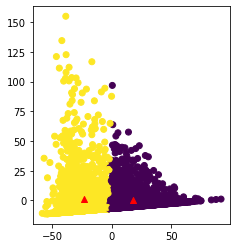

In [47]:
plt.scatter(X_pca_2_P5.values[:,0],X_pca_2_P5.values[:,1],c = kmeans_2.labels_)
centers = kmeans_2.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Daily Analysis - PCA - 3 clusters

In [48]:
k=3
kmeans_3 = KMeans(n_clusters=k).fit(X_pca_2_P5)

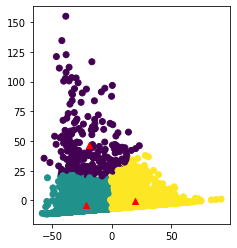

In [49]:
plt.scatter(X_pca_2_P5.values[:,0],X_pca_2_P5.values[:,1],c = kmeans_3.labels_)
centers = kmeans_3.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Daily Analysis - PCA - 4 clusters

In [50]:
k=4
kmeans_4 = KMeans(n_clusters=k).fit(X_pca_2_P5)

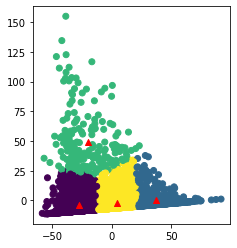

In [51]:
plt.scatter(X_pca_2_P5.values[:,0],X_pca_2_P5.values[:,1],c = kmeans_4.labels_)
centers = kmeans_4.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Daily Analysis - Daily Mean - 2 clusters

In [52]:
k=2
kmeans_2 = KMeans(n_clusters=k).fit(X_mean_P5)

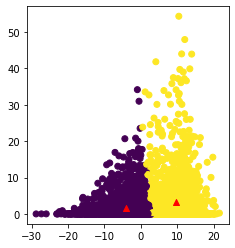

In [53]:
plt.scatter(X_mean_P5.values[:,0],X_mean_P5.values[:,1],c = kmeans_2.labels_)
centers = kmeans_2.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Daily Analysis - Daily Mean - 3 clusters

In [54]:
k=3
kmeans_3 = KMeans(n_clusters=k).fit(X_mean_P5)

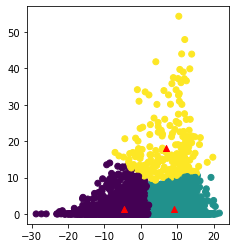

In [55]:
plt.scatter(X_mean_P5.values[:,0],X_mean_P5.values[:,1],c = kmeans_3.labels_)
centers = kmeans_3.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Daily Analysis - Daily Mean - 4 clusters

In [56]:
k=4
kmeans_4 = KMeans(n_clusters=k).fit(X_mean_P5)

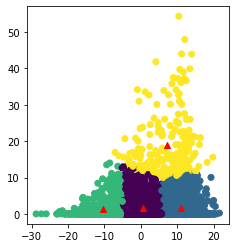

In [57]:
plt.scatter(X_mean_P5.values[:,0],X_mean_P5.values[:,1],c = kmeans_4.labels_)
centers = kmeans_4.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Weekly Analysis - Daily Mean - 2 clusters

In [58]:
k=2
kmeans_2 = KMeans(n_clusters=k).fit(df_P5_week[['TempWeekMean','PrecWeekMean']])

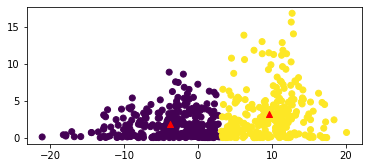

In [59]:
plt.scatter(df_P5_week['TempWeekMean'].values,df_P5_week['PrecWeekMean'].values,c = kmeans_2.labels_)
centers = kmeans_2.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Weekly Analysis - Daily Mean - 3 clusters

In [60]:
k=3
kmeans_3 = KMeans(n_clusters=k).fit(df_P5_week[['TempWeekMean','PrecWeekMean']])

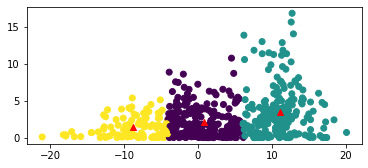

In [61]:
plt.scatter(df_P5_week['TempWeekMean'].values,df_P5_week['PrecWeekMean'].values,c = kmeans_3.labels_)
centers = kmeans_3.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Weekly Analysis - Daily Mean - 4 clusters

In [62]:
k=4
kmeans_4 = KMeans(n_clusters=k).fit(df_P5_week[['TempWeekMean','PrecWeekMean']])

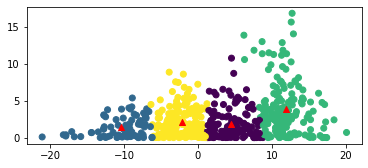

In [63]:
plt.scatter(df_P5_week['TempWeekMean'].values,df_P5_week['PrecWeekMean'].values,c = kmeans_4.labels_)
centers = kmeans_4.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Monthly Analysis - Daily Mean - 2 clusters

In [64]:
k=2
kmeans_2 = KMeans(n_clusters=k).fit(df_P5_month[['TempMonthMean','PrecMonthMean']])

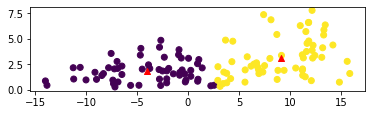

In [65]:
plt.scatter(df_P5_month['TempMonthMean'].values,df_P5_month['PrecMonthMean'].values,c = kmeans_2.labels_)
centers = kmeans_2.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Monthly Analysis - Daily Mean - 3 clusters

In [66]:
k=3
kmeans_3 = KMeans(n_clusters=k).fit(df_P5_month[['TempMonthMean','PrecMonthMean']])

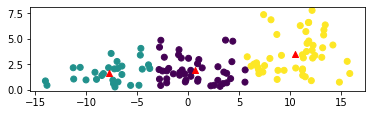

In [67]:
plt.scatter(df_P5_month['TempMonthMean'].values,df_P5_month['PrecMonthMean'].values,c = kmeans_3.labels_)
centers = kmeans_3.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Monthly Analysis - Daily Mean - 4 clusters

In [68]:
k=4
kmeans_4 = KMeans(n_clusters=k).fit(df_P5_month[['TempMonthMean','PrecMonthMean']])

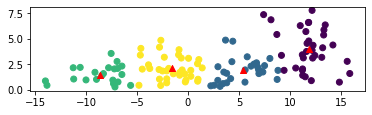

In [69]:
plt.scatter(df_P5_month['TempMonthMean'].values,df_P5_month['PrecMonthMean'].values,c = kmeans_4.labels_)
centers = kmeans_4.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Season Analysis - Daily Mean - 2 clusters

In [70]:
k=2
kmeans_2 = KMeans(n_clusters=k).fit(df_P5_season[['TempSeasonMean','PrecSeasonMean']])

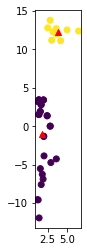

In [71]:
plt.scatter(df_P5_season['TempSeasonMean'].values,df_P5_season['PrecSeasonMean'].values,c = kmeans_2.labels_)
centers = kmeans_2.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Season Analysis - Daily Mean - 3 clusters

In [72]:
k=3
kmeans_3 = KMeans(n_clusters=k).fit(df_P5_season[['TempSeasonMean','PrecSeasonMean']])

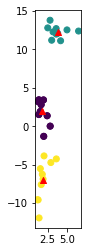

In [73]:
plt.scatter(df_P5_season['TempSeasonMean'].values,df_P5_season['PrecSeasonMean'].values,c = kmeans_3.labels_)
centers = kmeans_3.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^', c = 'r')
plt.axis('scaled')
plt.show()

#### Season Analysis - Daily Mean - 4 clusters

In [74]:
k=4
kmeans_4 = KMeans(n_clusters=k).fit(df_P5_season[['TempSeasonMean','PrecSeasonMean']])

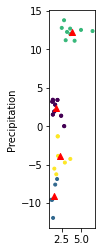

In [75]:
plt.scatter(df_P5_season['TempSeasonMean'].values,df_P5_season['PrecSeasonMean'].values,c = kmeans_4.labels_,marker='.')
centers = kmeans_4.cluster_centers_
plt.scatter(centers[:,0],centers[:,1],marker = '^',c = 'r')
plt.axis('scaled')
plt.ylabel('Precipitation')
plt.show()

### 2.1 Simplicial Complexes - 1-simplex

In [76]:
import networkx as nx
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from sklearn.metrics import pairwise_distances

In [77]:
def create_simplicial_complex(D,r):
    """
    Input: distance matrix and nonnegative radius
    Output: networkx graph 
    """
    
    G = nx.Graph()
    G.add_nodes_from(list(range(len(D))))
    edge_list = np.argwhere(D <= r) 
    G.add_edges_from(edge_list)
    
    # Remove self-loops
    G.remove_edges_from(nx.selfloop_edges(G))
    
    return G

#### Daily Analysis - PCA

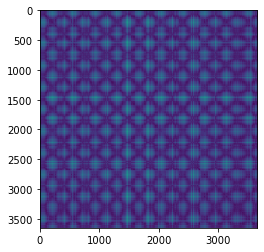

In [78]:
D = pairwise_distances(df_P5[['PC1','PC2']])
plt.imshow(D)
plt.show()

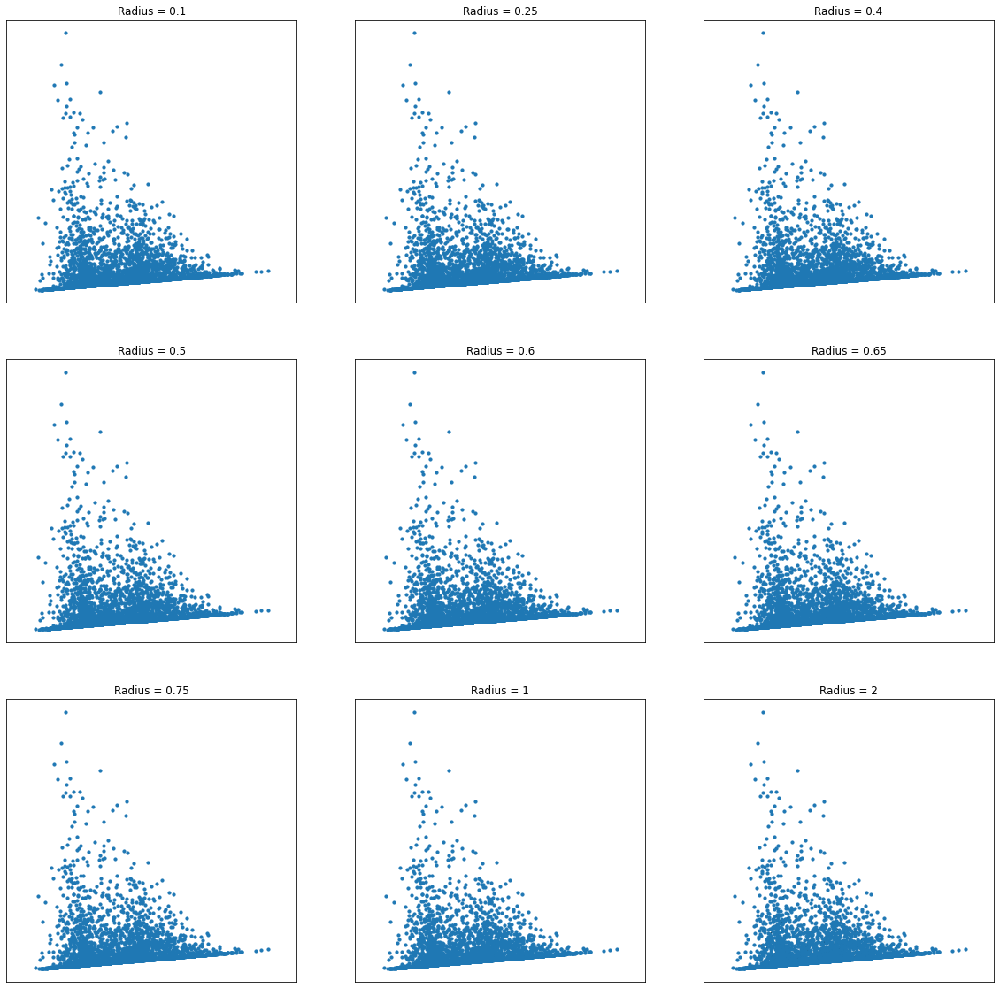

In [79]:
rs = [0.1,0.25,0.4,0.5,0.6,0.65,0.75,1,2]
pos = {n:df_P5[['PC1','PC2']].values[n,:] for n in range(len(df_P5))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 10)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

#### Daily Analysis - Daily Mean

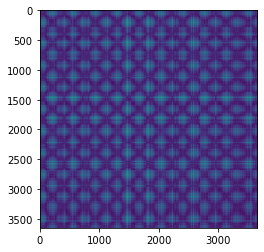

In [80]:
D = pairwise_distances(df_P5[['TempMean','PrecMean']])
plt.imshow(D)
plt.show()

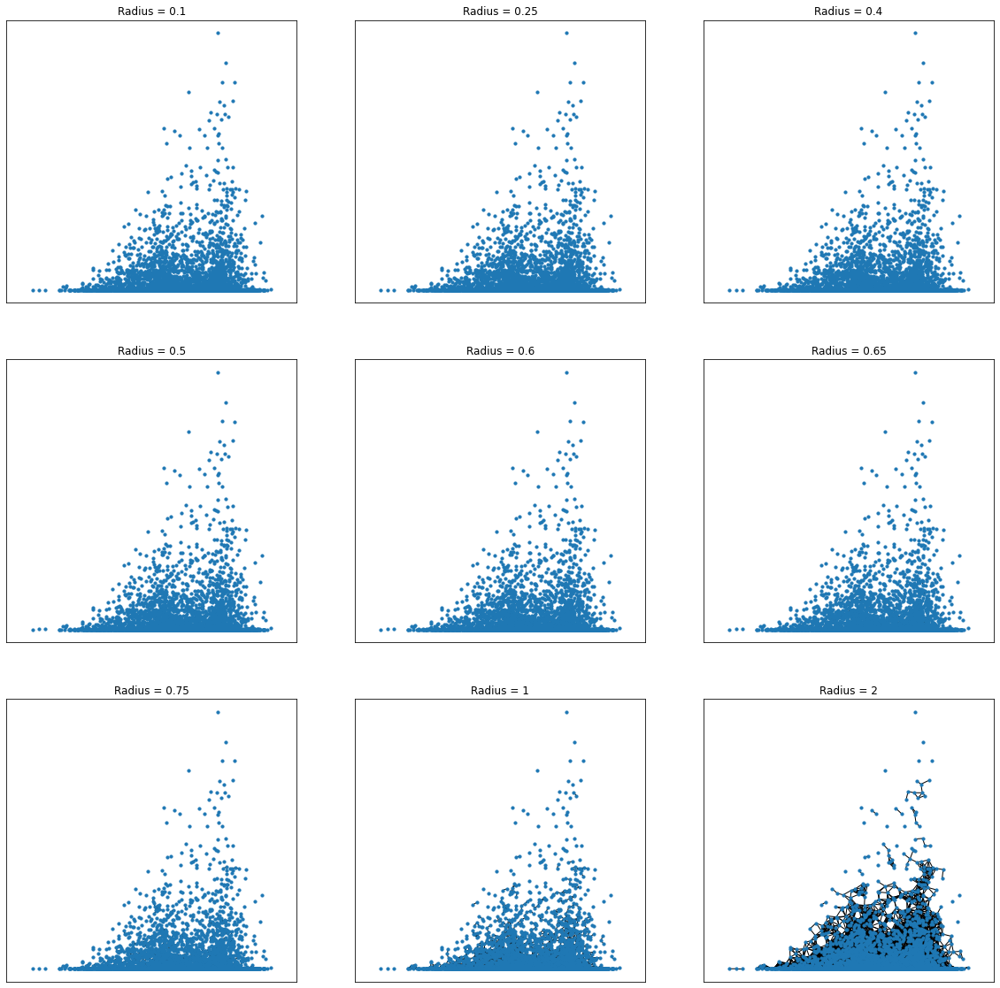

In [81]:
rs = [0.1,0.25,0.4,0.5,0.6,0.65,0.75,1,2]
pos = {n:df_P5[['TempMean','PrecMean']].values[n,:] for n in range(len(df_P5))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 10)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

#### Weekly Analysis - Daily Mean

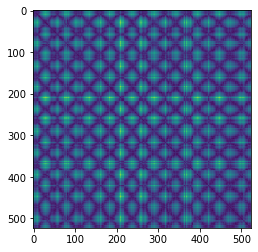

In [82]:
D = pairwise_distances(df_P5_week[['TempWeekMean','PrecWeekMean']])
plt.imshow(D)
plt.show()

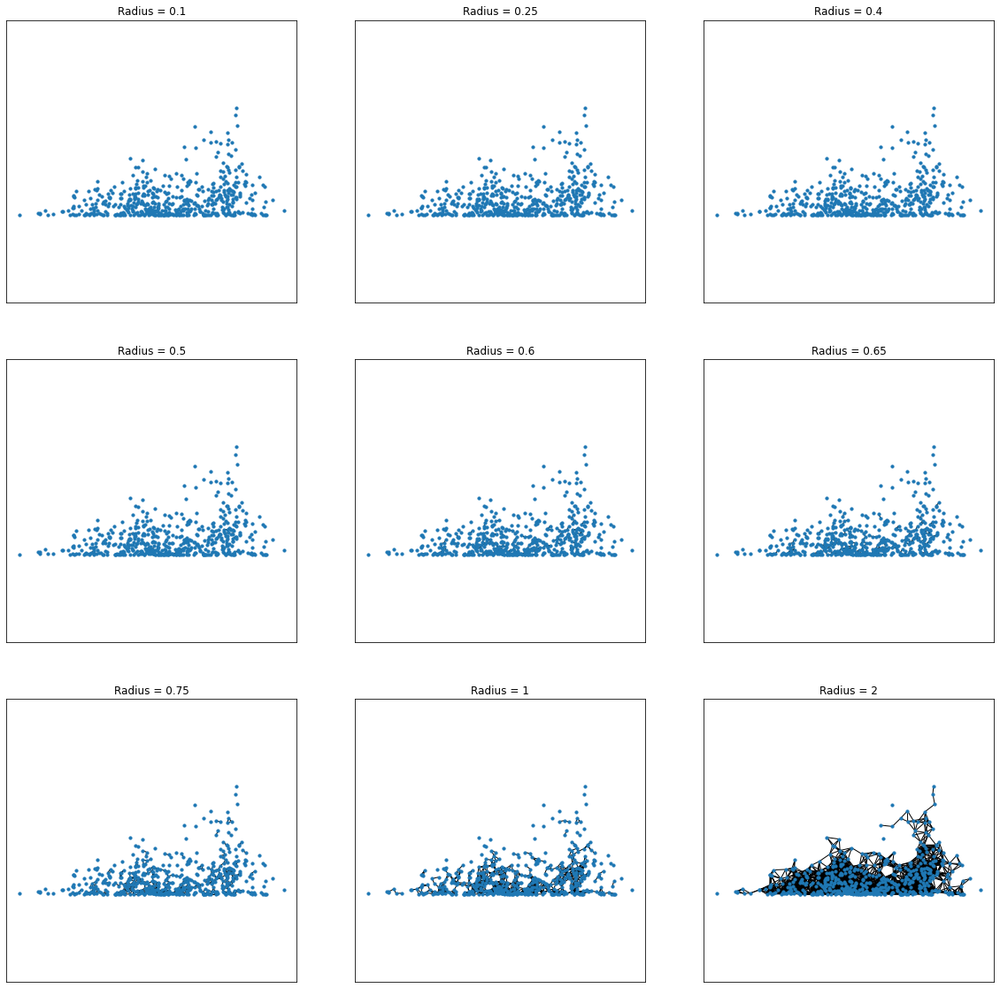

In [83]:
rs = [0.1,0.25,0.4,0.5,0.6,0.65,0.75,1,2]
pos = {n:df_P5_week[['TempWeekMean','PrecWeekMean']].values[n,:] for n in range(len(df_P5_week))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 10)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

#### Monthly Analysis - Daily Mean

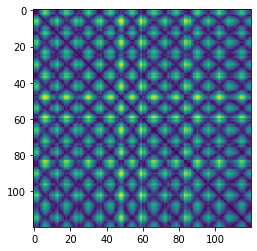

In [84]:
D = pairwise_distances(df_P5_month[['TempMonthMean','PrecMonthMean']])
plt.imshow(D)
plt.show()

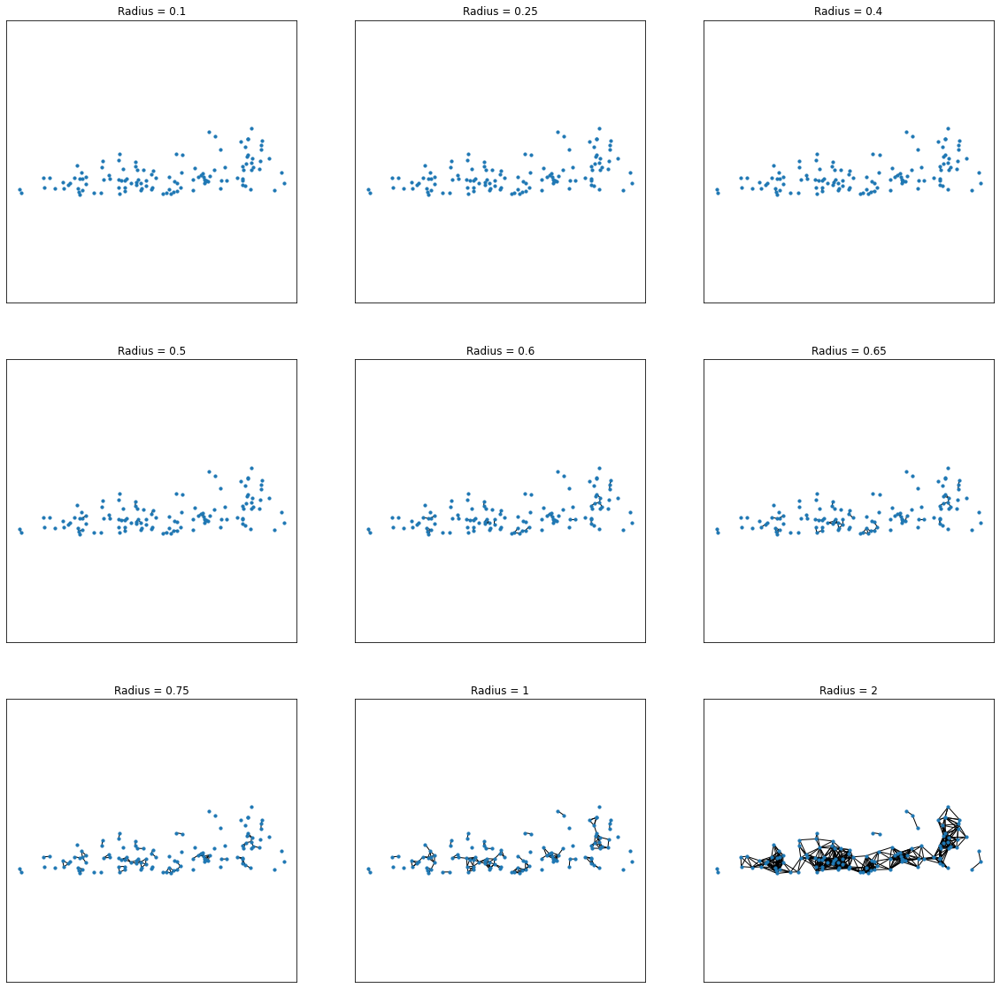

In [85]:
rs = [0.1,0.25,0.4,0.5,0.6,0.65,0.75,1,2]
pos = {n:df_P5_month[['TempMonthMean','PrecMonthMean']].values[n,:] for n in range(len(df_P5_month))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 10)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

#### Seasonal Analysis - Daily Mean - Temperature Above Surface vs. Precipitation

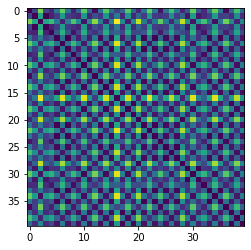

In [86]:
D = pairwise_distances(df_P5_season[['TempSeasonMean','PrecSeasonMean']])
plt.imshow(D)
plt.show()

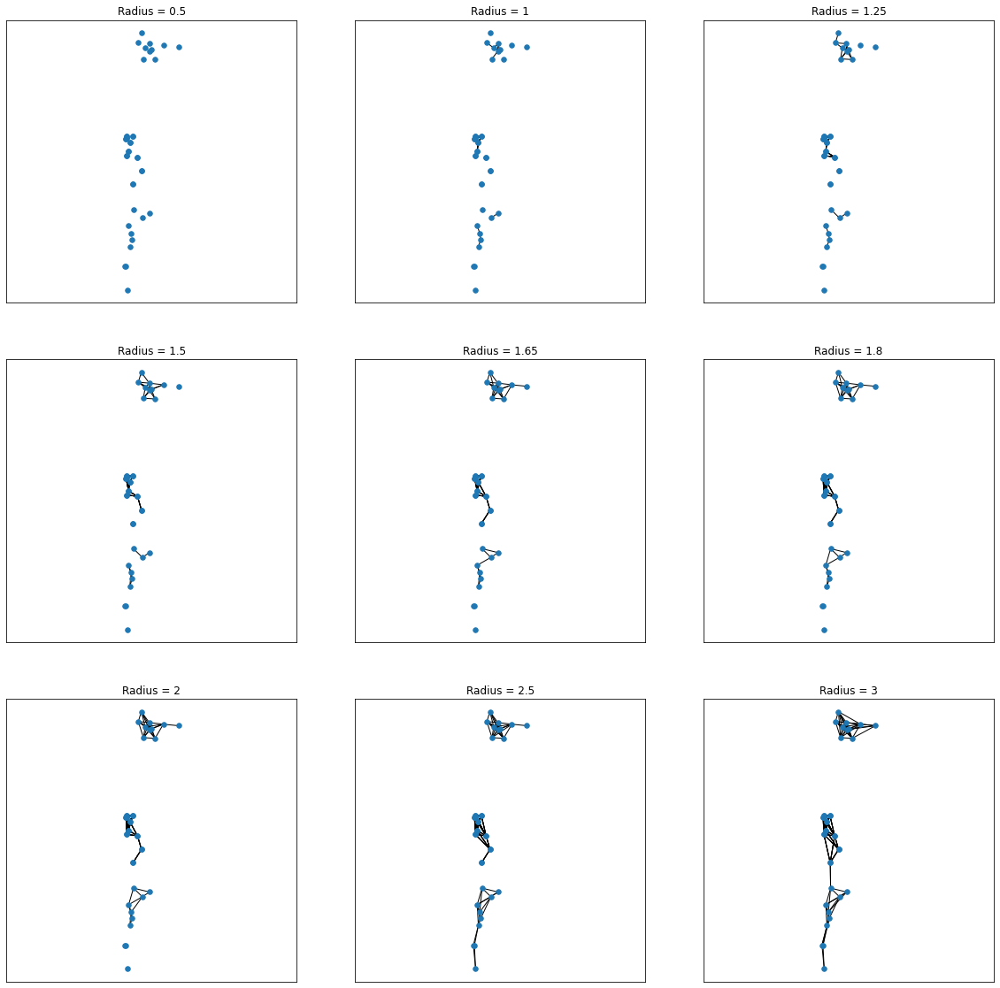

In [87]:
rs = [0.5,1,1.25,1.5,1.65,1.8,2,2.5,3]
pos = {n:df_P5_season[['TempSeasonMean','PrecSeasonMean']].values[n,:] for n in range(len(df_P5_season))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 30)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

#### Seasonal Analysis - Daily Mean - Flow vs. Temperature Above Surface

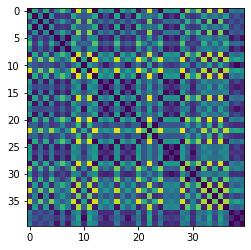

In [88]:
D = pairwise_distances(df_P5_season[['Flow','TempSeasonMean']])
plt.imshow(D)
plt.show()

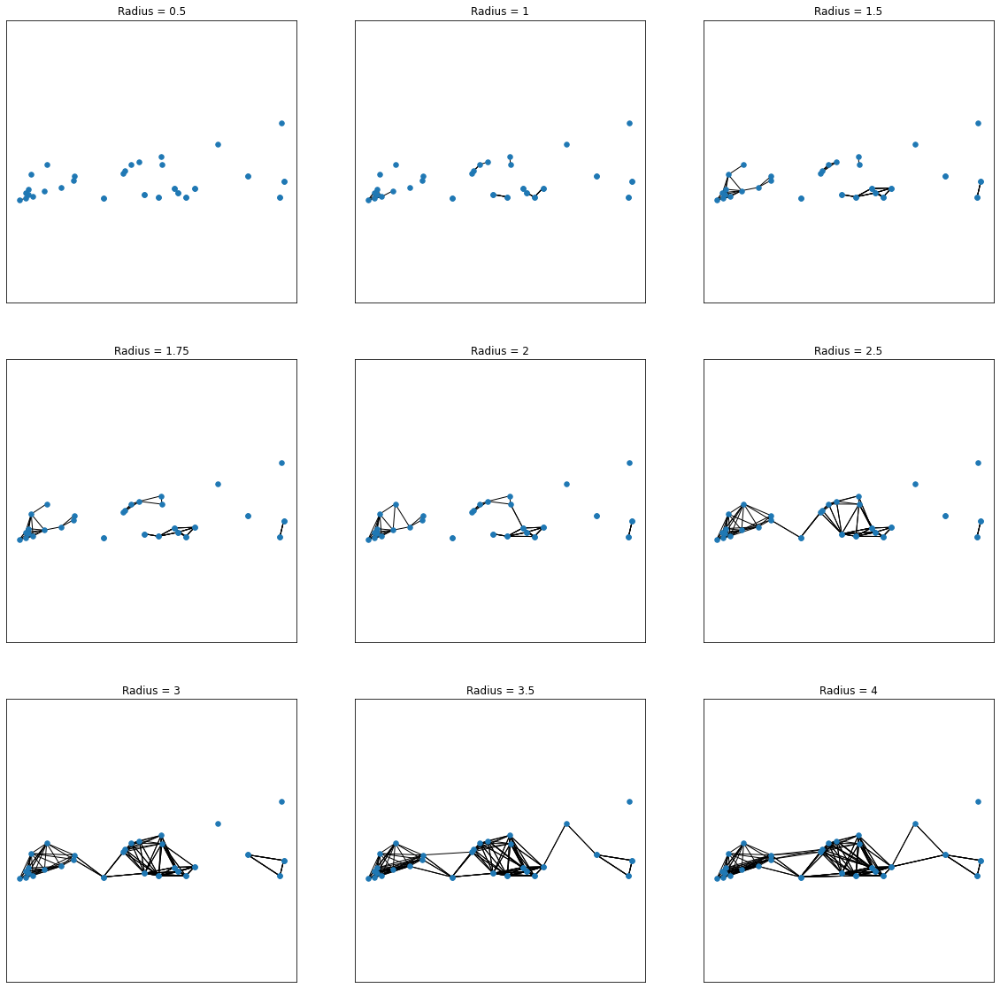

In [89]:
rs = [0.5,1,1.5,1.75,2,2.5,3,3.5,4]
pos = {n:df_P5_season[['Flow','TempSeasonMean']].values[n,:] for n in range(len(df_P5_season))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 30)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

#### Seasonal Analysis - Daily Mean - Flow vs. Precipitation

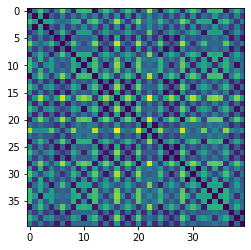

In [90]:
D = pairwise_distances(df_P5_season[['Flow','PrecSeasonMean']])
plt.imshow(D)
plt.show()

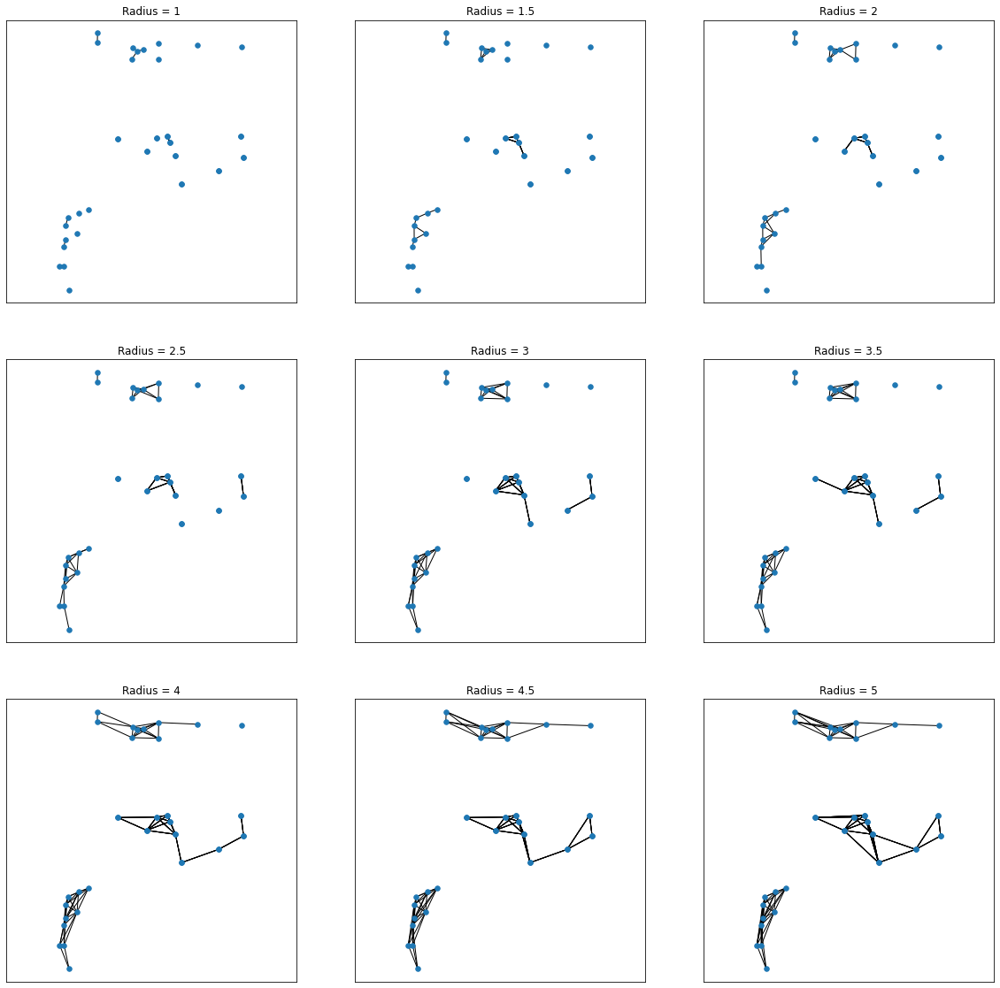

In [91]:
rs = [1,1.5,2,2.5,3,3.5,4,4.5,5]
pos = {n:df_P5_season[['Flow','PrecSeasonMean']].values[n,:] for n in range(len(df_P5_season))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G = create_simplicial_complex(D,r)
    plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 30)
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

### 2.2 Simplicial Complexes - 2-simplex

In [92]:
def create_2_dim_simplicial_complex(D,r):
    
    # Create 1-skeleton
    G = create_simplicial_complex(D,r)
    
    # Get a list of 2-simplices
    two_spx_list = []
    
    # Naive search for viable 2-simplices
    for edge in G.edges():
        for vertex in G.nodes():
            if vertex != edge[0] and vertex != edge[1] and D[edge[0],vertex] < r and D[edge[1],vertex] < r:
                two_spx_list.append([edge[0],edge[1],vertex])
                
    return G, two_spx_list

G, two_spx_list = create_2_dim_simplicial_complex(D,r)

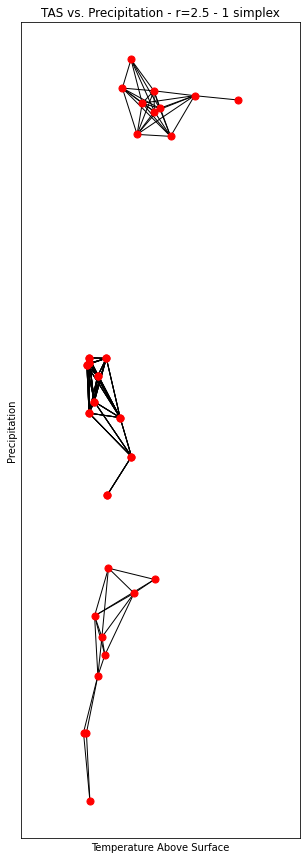

In [93]:
D = pairwise_distances(df_P5_season[['TempSeasonMean','PrecSeasonMean']])
pos = {n:df_P5_season[['TempSeasonMean','PrecSeasonMean']].values[n,:] for n in range(len(df_P5_season))}
plt.figure(figsize = (5,15))
r = 2.5
G = create_simplicial_complex(D,r)
nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 50,node_color='red')
plt.axis('equal')
plt.xlabel('Temperature Above Surface')
plt.ylabel('Precipitation')
plt.title('TAS vs. Precipitation - r=2.5 - 1 simplex')
plt.show()

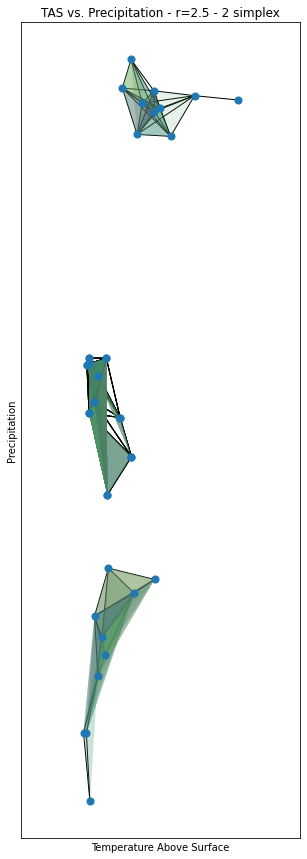

In [94]:
patches = []

for i,spx in enumerate(two_spx_list):
    position_array = np.array([[pos[vert][0],pos[vert][1]] for vert in spx])
    polygon = Polygon(position_array, True)
    patches.append(polygon)
    
fig, ax = plt.subplots(figsize = (5,15))

nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 50)
colors = 100*np.random.rand(len(patches))
p = PatchCollection(patches, alpha=0.05)
p.set_array(np.array(colors))
ax.add_collection(p)

plt.axis('equal')
plt.xlabel('Temperature Above Surface')
plt.ylabel('Precipitation')
plt.title('TAS vs. Precipitation - r=2.5 - 2 simplex')
plt.show()

#### Seasonal Analysis - Daily Mean - Temperature Above Surface vs. Precipitation

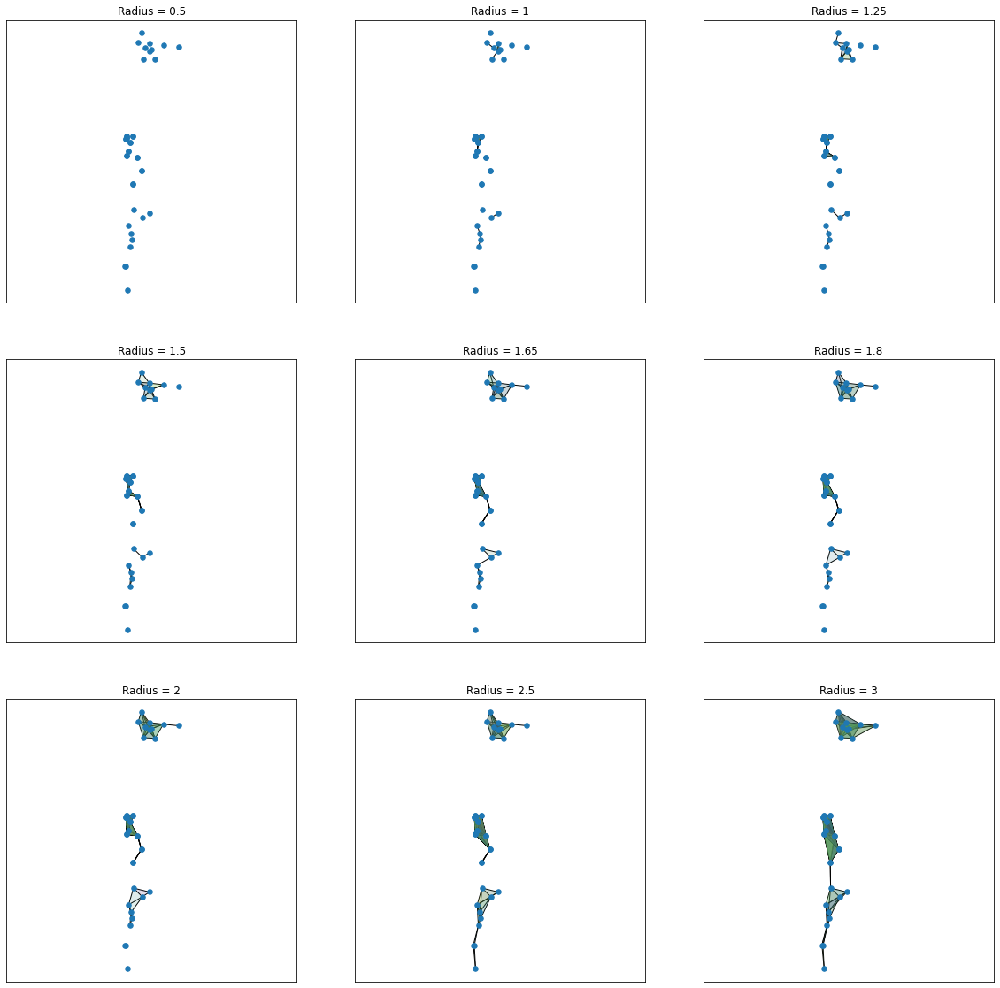

In [95]:
rs = [0.5,1,1.25,1.5,1.65,1.8,2,2.5,3]
pos = {n:df_P5_season[['TempSeasonMean','PrecSeasonMean']].values[n,:] for n in range(len(df_P5_season))}

plt.figure(figsize = (20,20))

for (j,r) in enumerate(rs):
    G, two_spx_list = create_2_dim_simplicial_complex(D,r)
    patches = []

    for i,spx in enumerate(two_spx_list):
        position_array = np.array([[pos[vert][0],pos[vert][1]] for vert in spx])
        polygon = Polygon(position_array, True)
        patches.append(polygon)
        
    ax = plt.subplot(3,3,j+1)
    nx.draw_networkx(G, pos = pos, with_labels = False,node_size = 30)
    colors = 100*np.random.rand(len(patches))
    p = PatchCollection(patches, alpha=0.05)
    p.set_array(np.array(colors))
    ax.add_collection(p)
    
    plt.axis('equal')
    plt.title('Radius = '+str(r))

plt.show()

### 3. Persistent Homology

In [96]:
import gudhi as gd

skeleton = gd.RipsComplex(distance_matrix = D, max_edge_length = 2) 
Rips_complex = skeleton.create_simplex_tree(max_dimension = 2)

rips_filtration = Rips_complex.get_filtration()
rips_list = list(rips_filtration)
print('Number of Simplices:',len(rips_list))
for splx in rips_list[0:200] :
    print(splx)

Number of Simplices: 660
([0], 0.0)
([1], 0.0)
([2], 0.0)
([3], 0.0)
([1, 3], 0.0)
([4], 0.0)
([5], 0.0)
([6], 0.0)
([7], 0.0)
([5, 7], 0.0)
([8], 0.0)
([9], 0.0)
([10], 0.0)
([11], 0.0)
([9, 11], 0.0)
([12], 0.0)
([13], 0.0)
([14], 0.0)
([15], 0.0)
([13, 15], 0.0)
([16], 0.0)
([17], 0.0)
([18], 0.0)
([19], 0.0)
([17, 19], 0.0)
([20], 0.0)
([21], 0.0)
([22], 0.0)
([23], 0.0)
([21, 23], 0.0)
([24], 0.0)
([25], 0.0)
([26], 0.0)
([27], 0.0)
([25, 27], 0.0)
([28], 0.0)
([29], 0.0)
([30], 0.0)
([31], 0.0)
([29, 31], 0.0)
([32], 0.0)
([33], 0.0)
([34], 0.0)
([35], 0.0)
([33, 35], 0.0)
([36], 0.0)
([37], 0.0)
([38], 0.0)
([39], 0.0)
([37, 39], 0.0)
([5, 21], 0.10271240235961793)
([7, 21], 0.10271240235961793)
([5, 7, 21], 0.10271240235961793)
([5, 23], 0.10271240235961793)
([7, 23], 0.10271240235961793)
([5, 7, 23], 0.10271240235961793)
([5, 21, 23], 0.10271240235961793)
([7, 21, 23], 0.10271240235961793)
([20, 28], 0.10280044533103948)
([5, 33], 0.19155823900909738)
([7, 33], 0.1915582390090

In [97]:
BarCodes = Rips_complex.persistence()
BarCodes

[(0, (0.0, inf)),
 (0, (0.0, inf)),
 (0, (0.0, inf)),
 (0, (0.0, inf)),
 (0, (0.0, inf)),
 (0, (0.0, 1.5803683084623956)),
 (0, (0.0, 1.569378329133694)),
 (0, (0.0, 1.5119158591819222)),
 (0, (0.0, 1.408463770841495)),
 (0, (0.0, 1.2868917476578488)),
 (0, (0.0, 1.2409486950778896)),
 (0, (0.0, 1.0519619560009612)),
 (0, (0.0, 1.0369064953067515)),
 (0, (0.0, 1.027388069650034)),
 (0, (0.0, 0.9942358304293604)),
 (0, (0.0, 0.8940182982805784)),
 (0, (0.0, 0.8654094413123703)),
 (0, (0.0, 0.8539194809345966)),
 (0, (0.0, 0.7803587599367685)),
 (0, (0.0, 0.7618702159167685)),
 (0, (0.0, 0.6266530506969878)),
 (0, (0.0, 0.6008715120740921)),
 (0, (0.0, 0.5912884245285142)),
 (0, (0.0, 0.5256350038911828)),
 (0, (0.0, 0.51207185582918)),
 (0, (0.0, 0.43780313353359396)),
 (0, (0.0, 0.21410619799532815)),
 (0, (0.0, 0.19155823900909738)),
 (0, (0.0, 0.10280044533103948)),
 (0, (0.0, 0.10271240235961793))]

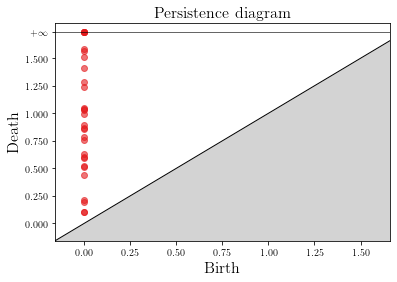

In [98]:
gd.plot_persistence_diagram(BarCodes)
plt.show()

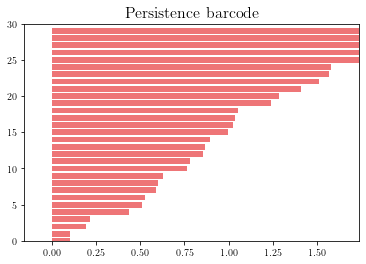

In [99]:
gd.plot_persistence_barcode(BarCodes)
plt.show()

### 4. Persistent Diagrams

In [100]:
def visualize_persistent_homology(X, style = 'barcodes', max_dimension = 2):

    """
    In: X is a Euclidean point cloud of size [num_points,dimension]
        style = 'barcodes' or 'diagrams'
        max_dimension = highest dimensional skeleton of the VR complex to compute. Highest degree
        persistent homology will be one less than this.
    Out: plots either persistence barcodes or persistence diagrams
    """
    
    D = pairwise_distances(X)
    skeleton = gd.RipsComplex(distance_matrix = D, max_edge_length = 10) 
    Rips_complex = skeleton.create_simplex_tree(max_dimension = max_dimension)
    BarCodes = Rips_complex.persistence()

    if style == 'barcodes':
        for dim in range(max_dimension):
            print('Dimension',dim)
            plt.figure()
            gd.plot_persistence_barcode([bar for bar in BarCodes if bar[0] == dim])
            plt.show()
    elif style == 'diagrams':
        plt.figure()
        gd.plot_persistence_diagram(BarCodes)
        plt.show()
            
    return

<Figure size 432x288 with 0 Axes>

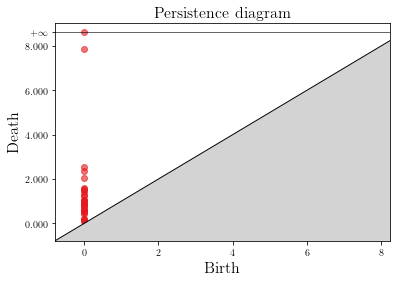

In [101]:
visualize_persistent_homology(df_P5_season[['TempSeasonMean','PrecSeasonMean']].values,style='diagrams')

### 5. Persistent Barcodes

In [102]:
#visualize_persistent_homology(df_P5_season[['TempSeasonMean','PrecSeasonMean']].values)

### 6. Time series signal to point cloud

#### Full Database

#### Full Database - Flow - Optimized

In [103]:
import plotly.graph_objects as go

y = df_clean['Flow'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Flow")
fig.show()

In [104]:
max_embedding_dimension = 30
max_time_delay = 30
stride = 20

from gtda.time_series import SingleTakensEmbedding

embedder = SingleTakensEmbedding(
    parameters_type="search",
    time_delay=max_time_delay,
    dimension=max_embedding_dimension,
    stride=stride)

In [105]:
def fit_embedder(embedder: SingleTakensEmbedding, y: np.ndarray, verbose: bool=True) -> np.ndarray:
    """Fits a Takens embedder and displays optimal search parameters."""
    y_embedded = embedder.fit_transform(y)

    if verbose:
        print(f"Shape of embedded time series: {y_embedded.shape}")
        print(
            f"Optimal embedding dimension is {embedder.dimension_} and time delay is {embedder.time_delay_}"
        )

    return y_embedded

In [106]:
y_embedded = fit_embedder(embedder, y)

Shape of embedded time series: (1043, 12)
Optimal embedding dimension is 12 and time delay is 30


In [107]:
pca = PCA(n_components=3)
y_embedded_pca = pca.fit_transform(y_embedded)

from gtda.plotting import plot_point_cloud

plot_point_cloud(y_embedded_pca)
#plot_point_cloud(y_embedded)

In [108]:
#y_embedded = y_embedded[None, :, :]
y_embedded = y_embedded_pca[None, :, :]

homology_dimensions = [0, 1, 2]

from gtda.homology import VietorisRipsPersistence

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
print("Persistence diagram for flow")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for flow


array([[[0.        , 0.3170101 , 0.        ],
        [0.        , 0.38229325, 0.        ],
        [0.        , 0.39511457, 0.        ],
        ...,
        [4.26021481, 4.41224289, 2.        ],
        [3.96643829, 4.0383296 , 2.        ],
        [2.86270094, 3.15211868, 2.        ]]])

#### Full Database - Temperature Above Surface - Optimized

In [109]:
y = X_mean['TempMean'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Temperature Above Surface")
fig.show()

In [110]:
max_embedding_dimension = 30
max_time_delay = 30
stride = 20

embedder = SingleTakensEmbedding(
    parameters_type="search",
    time_delay=max_time_delay,
    dimension=max_embedding_dimension,
    stride=stride)

In [111]:
y_embedded = fit_embedder(embedder, y)

Shape of embedded time series: (1049, 8)
Optimal embedding dimension is 8 and time delay is 30


In [112]:
pca = PCA(n_components=3)
y_embedded_pca = pca.fit_transform(y_embedded)

plot_point_cloud(y_embedded_pca)
#plot_point_cloud(y_embedded)

In [113]:
#y_embedded = y_embedded[None, :, :]
y_embedded = y_embedded_pca[None, :, :]

homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
print("Persistence diagram for temperature above surface")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for temperature above surface


array([[[0.        , 0.25400162, 0.        ],
        [0.        , 0.34658721, 0.        ],
        [0.        , 0.42043874, 0.        ],
        ...,
        [3.11888361, 3.16566801, 2.        ],
        [3.04870272, 3.06603169, 2.        ],
        [3.03549671, 3.10927773, 2.        ]]])

#### Full Database - Precipitation - Optimized

In [114]:
y = X_mean['PrecMean'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Precipitation")
fig.show()

In [115]:
max_embedding_dimension = 30
max_time_delay = 30
stride = 20

embedder = SingleTakensEmbedding(
    parameters_type="search",
    time_delay=max_time_delay,
    dimension=max_embedding_dimension,
    stride=stride)

In [116]:
y_embedded = fit_embedder(embedder, y)

Shape of embedded time series: (1038, 17)
Optimal embedding dimension is 17 and time delay is 27


In [117]:
pca = PCA(n_components=3)
y_embedded_pca = pca.fit_transform(y_embedded)

plot_point_cloud(y_embedded_pca)
#plot_point_cloud(y_embedded)

In [118]:
#y_embedded = y_embedded[None, :, :]
y_embedded = y_embedded_pca[None, :, :]

homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
print("Persistence diagram for precipitation")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for precipitation


array([[[0.        , 0.09241887, 0.        ],
        [0.        , 0.11416624, 0.        ],
        [0.        , 0.11655243, 0.        ],
        ...,
        [1.02848876, 1.08203638, 2.        ],
        [0.99338973, 1.09893203, 2.        ],
        [0.79727751, 0.93226749, 2.        ]]])

#### Daily Analysis - Flow

In [119]:
import plotly.graph_objects as go

y = df_P5['Flow'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Flow")
fig.show()

In [120]:
from gtda.time_series import SingleTakensEmbedding

embedding_dimension = 3
embedding_time_delay = 8
stride = 10

embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay,
    dimension=embedding_dimension,
    stride=stride)

y_embedded = embedder.fit_transform(y)
print(f"Shape of embedded time series: {y_embedded.shape}")

Shape of embedded time series: (364, 3)


In [121]:
from gtda.plotting import plot_point_cloud

plot_point_cloud(y_embedded)

In [122]:
y_embedded = y_embedded[None, :, :]

from gtda.homology import VietorisRipsPersistence

# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions, n_jobs=6)
print("Persistence diagram for daily flow")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for daily flow


array([[[0.        , 0.05867839, 0.        ],
        [0.        , 0.06404996, 0.        ],
        [0.        , 0.09849833, 0.        ],
        ...,
        [1.06657481, 1.07160115, 2.        ],
        [0.99077052, 1.12075305, 2.        ],
        [0.9679715 , 0.97631311, 2.        ]]])

#### Daily Analysis - Flow - Optimized

In [123]:
max_embedding_dimension = 30
max_time_delay = 30
stride = 20

y = df_P5['Flow'].values

embedder = SingleTakensEmbedding(
    parameters_type="search",
    time_delay=max_time_delay,
    dimension=max_embedding_dimension,
    stride=stride)

In [124]:
def fit_embedder(embedder: SingleTakensEmbedding, y: np.ndarray, verbose: bool=True) -> np.ndarray:
    """Fits a Takens embedder and displays optimal search parameters."""
    y_embedded = embedder.fit_transform(y)

    if verbose:
        print(f"Shape of embedded time series: {y_embedded.shape}")
        print(
            f"Optimal embedding dimension is {embedder.dimension_} and time delay is {embedder.time_delay_}"
        )

    return y_embedded

In [125]:
y_embedded = fit_embedder(embedder, y)

Shape of embedded time series: (180, 3)
Optimal embedding dimension is 3 and time delay is 30


In [126]:
plot_point_cloud(y_embedded)

In [127]:
y_embedded = y_embedded[None, :, :]

homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
print("Persistence diagram for daily flow")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for daily flow


array([[[ 0.        ,  0.27143875,  0.        ],
        [ 0.        ,  0.3195819 ,  0.        ],
        [ 0.        ,  0.53442299,  0.        ],
        [ 0.        ,  0.56466389,  0.        ],
        [ 0.        ,  0.59521389,  0.        ],
        [ 0.        ,  0.64445269,  0.        ],
        [ 0.        ,  0.65840518,  0.        ],
        [ 0.        ,  0.66620713,  0.        ],
        [ 0.        ,  0.67093456,  0.        ],
        [ 0.        ,  0.67126709,  0.        ],
        [ 0.        ,  0.69399852,  0.        ],
        [ 0.        ,  0.71639377,  0.        ],
        [ 0.        ,  0.74499303,  0.        ],
        [ 0.        ,  0.74824053,  0.        ],
        [ 0.        ,  0.75013709,  0.        ],
        [ 0.        ,  0.76195163,  0.        ],
        [ 0.        ,  0.76249802,  0.        ],
        [ 0.        ,  0.76299274,  0.        ],
        [ 0.        ,  0.77031124,  0.        ],
        [ 0.        ,  0.77708387,  0.        ],
        [ 0.        

#### Daily Analysis - Temperature Above Surface

In [128]:
y = df_P5['TempMean'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Temperature Above Surface")
fig.show()

In [129]:
embedding_dimension = 3
embedding_time_delay = 8
stride = 10

embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay,
    dimension=embedding_dimension,
    stride=stride)

y_embedded = embedder.fit_transform(y)
print(f"Shape of embedded time series: {y_embedded.shape}")

Shape of embedded time series: (364, 3)


In [130]:
from gtda.plotting import plot_point_cloud

plot_point_cloud(y_embedded)

In [131]:
y_embedded = y_embedded[None, :, :]

from gtda.homology import VietorisRipsPersistence

# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions, n_jobs=6)
print("Persistence diagram for daily temperature above surface")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for daily temperature above surface


array([[[0.        , 0.46294814, 0.        ],
        [0.        , 0.4658722 , 0.        ],
        [0.        , 0.47842333, 0.        ],
        ...,
        [3.35137701, 3.42716098, 2.        ],
        [3.24729705, 3.29335284, 2.        ],
        [2.5325048 , 2.58967566, 2.        ]]])

#### Daily Analysis -Temperature Above Surface - Optimized

In [132]:
max_embedding_dimension = 30
max_time_delay = 30
stride = 40

y = df_P5['TempMean'].values

embedder = SingleTakensEmbedding(
    parameters_type="search",
    time_delay=max_time_delay,
    dimension=max_embedding_dimension,
    stride=stride)

In [133]:
y_embedded = fit_embedder(embedder, y)

Shape of embedded time series: (90, 3)
Optimal embedding dimension is 3 and time delay is 29


In [134]:
#pca = PCA(n_components=3)
#y_embedded_pca = pca.fit_transform(y_embedded)
#plot_point_cloud(y_embedded_pca)

plot_point_cloud(y_embedded)

In [135]:
y_embedded = y_embedded[None, :, :]

homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
print("Persistence diagram for daily temperature above surface")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for daily temperature above surface


array([[[ 0.        ,  1.17819691,  0.        ],
        [ 0.        ,  1.24944437,  0.        ],
        [ 0.        ,  1.37338006,  0.        ],
        [ 0.        ,  1.43135107,  0.        ],
        [ 0.        ,  1.54044247,  0.        ],
        [ 0.        ,  1.6789546 ,  0.        ],
        [ 0.        ,  1.74857938,  0.        ],
        [ 0.        ,  1.81455028,  0.        ],
        [ 0.        ,  1.83599138,  0.        ],
        [ 0.        ,  1.85588813,  0.        ],
        [ 0.        ,  1.88073421,  0.        ],
        [ 0.        ,  1.98316991,  0.        ],
        [ 0.        ,  2.00803947,  0.        ],
        [ 0.        ,  2.01098824,  0.        ],
        [ 0.        ,  2.03102469,  0.        ],
        [ 0.        ,  2.06155276,  0.        ],
        [ 0.        ,  2.22524786,  0.        ],
        [ 0.        ,  2.26347804,  0.        ],
        [ 0.        ,  2.35122776,  0.        ],
        [ 0.        ,  2.3729701 ,  0.        ],
        [ 0.        

#### Daily Analysis - Precipitation

In [136]:
y = df_P5['PrecMean'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Precipitation")
fig.show()

In [137]:
from gtda.time_series import SingleTakensEmbedding

embedding_dimension = 3
embedding_time_delay = 8
stride = 10

embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay,
    dimension=embedding_dimension,
    stride=stride)

y_embedded = embedder.fit_transform(y)
print(f"Shape of embedded time series: {y_embedded.shape}")

Shape of embedded time series: (364, 3)


In [138]:
from gtda.plotting import plot_point_cloud

plot_point_cloud(y_embedded)

In [139]:
y_embedded = y_embedded[None, :, :]

from gtda.homology import VietorisRipsPersistence

# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions, n_jobs=6)
print("Persistence diagram for daily precipitation")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for daily precipitation


array([[[0.00000000e+00, 8.06548994e-10, 0.00000000e+00],
        [0.00000000e+00, 7.45058060e-09, 0.00000000e+00],
        [0.00000000e+00, 1.66600049e-08, 0.00000000e+00],
        ...,
        [1.86488008e+00, 1.88882351e+00, 2.00000000e+00],
        [1.83188498e+00, 1.86256158e+00, 2.00000000e+00],
        [8.39973509e-01, 8.64884198e-01, 2.00000000e+00]]])

#### Monthly Analysis - Flow

In [140]:
y = df_P5_month['Flow'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Flow")
fig.show()

In [141]:
embedding_dimension = 3
embedding_time_delay = 8
stride = 10

embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay,
    dimension=embedding_dimension,
    stride=stride)

y_embedded = embedder.fit_transform(y)
print(f"Shape of embedded time series: {y_embedded.shape}")

Shape of embedded time series: (11, 3)


In [142]:
plot_point_cloud(y_embedded)

In [143]:
y_embedded = y_embedded[None, :, :]

# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions, n_jobs=6)
print("Persistence diagram for monthly flow")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for monthly flow


array([[[ 0.        ,  1.26418865,  0.        ],
        [ 0.        ,  2.86974525,  0.        ],
        [ 0.        ,  2.94482064,  0.        ],
        [ 0.        ,  4.0642643 ,  0.        ],
        [ 0.        ,  4.54480934,  0.        ],
        [ 0.        ,  5.23285246,  0.        ],
        [ 0.        ,  5.63622093,  0.        ],
        [ 0.        ,  7.614676  ,  0.        ],
        [ 0.        ,  9.20494652,  0.        ],
        [ 0.        , 11.36854458,  0.        ],
        [ 6.31382561,  6.86889315,  1.        ],
        [ 0.        ,  0.        ,  2.        ]]])

#### Monthly Analysis - Temperature Above Surface

In [144]:
y = df_P5_month['TempMonthMean'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Temperature Above Surface")
fig.show()

In [145]:
embedding_dimension = 3
embedding_time_delay = 8
stride = 10

embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay,
    dimension=embedding_dimension,
    stride=stride)

y_embedded = embedder.fit_transform(y)
print(f"Shape of embedded time series: {y_embedded.shape}")

Shape of embedded time series: (11, 3)


In [146]:
plot_point_cloud(y_embedded)

In [147]:
y_embedded = y_embedded[None, :, :]

# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions, n_jobs=6)
print("Persistence diagram for monthly temperature")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for monthly temperature


array([[[ 0.        ,  3.59493756,  0.        ],
        [ 0.        ,  4.55799007,  0.        ],
        [ 0.        ,  5.01526403,  0.        ],
        [ 0.        ,  7.55649424,  0.        ],
        [ 0.        ,  8.43065357,  0.        ],
        [ 0.        , 10.33134174,  0.        ],
        [ 0.        , 10.81978989,  0.        ],
        [ 0.        , 11.81744957,  0.        ],
        [ 0.        , 12.05543709,  0.        ],
        [ 0.        , 12.05732918,  0.        ],
        [13.72607994, 15.25484943,  1.        ],
        [12.57820988, 19.23436546,  1.        ],
        [ 0.        ,  0.        ,  2.        ]]])

#### Monthly Analysis - Precipitation

In [148]:
y = df_P5_month['PrecMonthMean'].values
fig = go.Figure(data=go.Scatter(y=y))
fig.update_layout(xaxis_title="Days", yaxis_title="Precipitation")
fig.show()

In [149]:
embedding_dimension = 3
embedding_time_delay = 8
stride = 10

embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay,
    dimension=embedding_dimension,
    stride=stride)

y_embedded = embedder.fit_transform(y)
print(f"Shape of embedded time series: {y_embedded.shape}")

Shape of embedded time series: (11, 3)


In [150]:
plot_point_cloud(y_embedded)

In [151]:
y_embedded = y_embedded[None, :, :]

# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

persistence = VietorisRipsPersistence(homology_dimensions=homology_dimensions, n_jobs=6)
print("Persistence diagram for monthly precipitation")
persistence.fit_transform_plot(y_embedded)

Persistence diagram for monthly precipitation


array([[[0.        , 0.54111129, 0.        ],
        [0.        , 0.67566717, 0.        ],
        [0.        , 0.97605693, 0.        ],
        [0.        , 1.02776551, 0.        ],
        [0.        , 1.31596398, 0.        ],
        [0.        , 1.54241741, 0.        ],
        [0.        , 1.60688221, 0.        ],
        [0.        , 1.78585768, 0.        ],
        [0.        , 1.91245389, 0.        ],
        [0.        , 1.93522632, 0.        ],
        [0.        , 0.        , 1.        ],
        [0.        , 0.        , 2.        ]]])